In [2]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [3]:
%cd gdrive/MyDrive/NLP_personalityTraits

/content/gdrive/MyDrive/NLP_personalityTraits


In [4]:
ls

arabert/                 multi_df.csv
archive/                 result.txt
binary_df.csv            StopWordsList.txt
DataPreprocessing.ipynb  TestSampling_Binary_Task.csv
datapreprocessing.py     TestSampling_Multi_Task.csv
df_binary.csv            TF-IDF.ipynb
df_multi.csv             TrainSampling_Binary_Task.csv
emojis.csv               TrainSampling_Multi_Task.csv


In [5]:
import requests
from io import BytesIO
from io import StringIO
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import string
import re
from collections import defaultdict
from pathlib import Path
import pandas as df
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix,accuracy_score, classification_report
import os

#DataFrame:(Multiclass / binary class):

In [7]:
directory = 'archive'
for filename in os.listdir(directory):
    if filename.endswith(".txt"):
        filen = os.path.join(directory, filename)
        #f = open(filen, 'r')
        #fp = pd.read_csv(directory,filename)
        ##print(filen)
        #data = pd.read_csv(f)#,error_bad_lines = False)#, index_col='ID', end = '\n')
        #print(filen)

In [8]:
from collections import defaultdict
from pathlib import Path
import pandas as df
''' 
The defaultdict in contrast will simply create any items that you try to access (provided of course they do not exist yet).
To create such a "default" item, it calls the function object that you pass to the constructor 
(more precisely, it's an arbitrary "callable" object, which includes function and type objects).
 For the first example, default items are created using int(), which will return the integer object 0. 
 For the second example, default items are created using list(), which returns a new empty list object.

'''
#loading test and train data of multiclass representation
train_multi = pd.read_csv('TrainSampling_Multi_Task.csv',low_memory=True)
test_multi = pd.read_csv('TestSampling_Multi_Task.csv',low_memory=True)

#combining test and train data
output=train_multi.append(test_multi)
output.to_csv("multi_df.csv", sep=',')
df1 = pd.read_csv("multi_df.csv")
#loading a multiple .txt files in to python as dataframe
my_dir_path = "archive/"

Tweets = defaultdict(list)
for file in Path(my_dir_path).iterdir():#Iterate over the files in this directory.
    with open(file, "r") as file_open:
        Tweets["file_name"].append(file.name)
        Tweets["tweets"].append(file_open.read())
df = pd.DataFrame(Tweets)

#df = df.reset_index()
#df.columns[0] = 'ID'
#df['ID'] = df.index 

df.insert(0, 'ID', range(0, 0 + len(df)))


df_multi = pd.merge(df.reset_index(), df1.reset_index(), how='inner', on=['ID'],)

In [9]:
df.head()

,ID,file_name,tweets
0,0,0.txt,يأتي الحلال والحرام في وقت واحد فلتختار بتأن ح...
1,1,4.txt,#المنيا\nعجيب اننى لم اؤذيك بكفرى\n بينما انت ...
2,2,6.txt,هو احنا مش هنتجوز بقى حسن عزام عنده شبشب في ال...
3,3,3.txt,شايفك يا واطي :'D\n #المباحث_بتوزع_فولورز_بالد...
4,4,9.txt,الطبيعي بتاع الولاد إنهم ميعملوش إحترام للبنت ...


In [10]:
df_multi.head()

,index_x,ID,file_name,tweets,index_y,Unnamed: 0,NumOfTweets,NumOfFollowers,NumOfFollowing,NumOfFavourites,NumOfTweetsPerDay,RetweetCount,ReplyCount,O_Sc,C_Sc,E_Sc,A_Sc,N_Sc,O,C,E,A,N
0,0,0,0.txt,يأتي الحلال والحرام في وقت واحد فلتختار بتأن ح...,88,28,2743,30,133,77,1,37,2,80,76,44,80,68,4,4,2,3,4
1,1,1,4.txt,#المنيا\nعجيب اننى لم اؤذيك بكفرى\n بينما انت ...,34,34,461,261,163,1392,0,397,649,48,72,48,76,72,1,4,2,3,4
2,2,2,6.txt,هو احنا مش هنتجوز بقى حسن عزام عنده شبشب في ال...,19,19,5,1,4,1,0,2,0,60,44,24,72,68,2,1,1,3,4
3,3,3,3.txt,شايفك يا واطي :'D\n #المباحث_بتوزع_فولورز_بالد...,74,14,52,231,220,2,0,1,1,44,76,40,56,40,1,4,1,1,1
4,4,4,9.txt,الطبيعي بتاع الولاد إنهم ميعملوش إحترام للبنت ...,59,59,41,4,8,6,0,9,0,76,52,52,68,60,3,2,3,2,3


In [11]:
df_multi.drop(['index_x','index_y','file_name','Unnamed: 0'], axis = 1 , inplace=True)


In [12]:
df_multi.to_csv(r"df_multi.csv", index = False)

In [13]:
df_multi.head()

,ID,tweets,NumOfTweets,NumOfFollowers,NumOfFollowing,NumOfFavourites,NumOfTweetsPerDay,RetweetCount,ReplyCount,O_Sc,C_Sc,E_Sc,A_Sc,N_Sc,O,C,E,A,N
0,0,يأتي الحلال والحرام في وقت واحد فلتختار بتأن ح...,2743,30,133,77,1,37,2,80,76,44,80,68,4,4,2,3,4
1,1,#المنيا\nعجيب اننى لم اؤذيك بكفرى\n بينما انت ...,461,261,163,1392,0,397,649,48,72,48,76,72,1,4,2,3,4
2,2,هو احنا مش هنتجوز بقى حسن عزام عنده شبشب في ال...,5,1,4,1,0,2,0,60,44,24,72,68,2,1,1,3,4
3,3,شايفك يا واطي :'D\n #المباحث_بتوزع_فولورز_بالد...,52,231,220,2,0,1,1,44,76,40,56,40,1,4,1,1,1
4,4,الطبيعي بتاع الولاد إنهم ميعملوش إحترام للبنت ...,41,4,8,6,0,9,0,76,52,52,68,60,3,2,3,2,3


In [14]:
df_multi.columns

Index(['ID', 'tweets', 'NumOfTweets', 'NumOfFollowers', 'NumOfFollowing',
       'NumOfFavourites', 'NumOfTweetsPerDay', 'RetweetCount', 'ReplyCount',
       'O_Sc', 'C_Sc', 'E_Sc', 'A_Sc', 'N_Sc', 'O', 'C', 'E', 'A', 'N'],
      dtype='object')

In [15]:
df_multi.shape

(92, 19)

In [16]:
#loading test and train data of binary representation
train_multi = pd.read_csv('TrainSampling_Binary_Task.csv',low_memory=True)
test_multi = pd.read_csv('TestSampling_Binary_Task.csv',low_memory=True)

#combining test and train data
output=train_multi.append(test_multi)
output.to_csv("binary_df.csv", sep=',')
df2 = pd.read_csv("binary_df.csv")
#loading a multiple .txt files in to python as dataframe
my_dir_path = "archive/"

Tweets = defaultdict(list)
for file in Path(my_dir_path).iterdir():#Iterate over the files in this directory.
    with open(file, "r") as file_open:
        Tweets["file_name"].append(file.name)
        Tweets["tweets"].append(file_open.read())
df = pd.DataFrame(Tweets)

#df = df.reset_index()
#df.columns[0] = 'ID'
#df['ID'] = df.index 

df.insert(0, 'ID', range(0, 0 + len(df)))


df_binary = pd.merge(df.reset_index(), df2.reset_index(), how='inner', on=['ID'])

In [17]:
df_binary.drop(['index_x','index_y','file_name','Unnamed: 0'], axis = 1 , inplace=True)

In [18]:
df_binary.head()

,ID,tweets,NumOfTweets,NumOfFollowers,NumOfFollowing,NumOfFavourites,NumOfTweetsPerDay,RetweetCount,ReplyCount,O_Sc,C_Sc,E_Sc,A_Sc,N_Sc,O,C,E,A,N
0,0,يأتي الحلال والحرام في وقت واحد فلتختار بتأن ح...,2743,30,133,77,1,37,2,80,76,44,80,68,1,1,0,1,1
1,1,#المنيا\nعجيب اننى لم اؤذيك بكفرى\n بينما انت ...,461,261,163,1392,0,397,649,48,72,48,76,72,0,1,0,1,1
2,2,هو احنا مش هنتجوز بقى حسن عزام عنده شبشب في ال...,5,1,4,1,0,2,0,60,44,24,72,68,0,0,0,0,1
3,3,شايفك يا واطي :'D\n #المباحث_بتوزع_فولورز_بالد...,52,231,220,2,0,1,1,44,76,40,56,40,0,1,0,0,0
4,4,الطبيعي بتاع الولاد إنهم ميعملوش إحترام للبنت ...,41,4,8,6,0,9,0,76,52,52,68,60,1,0,0,0,1


In [19]:
df_binary.to_csv(r"df_binary.csv", index = False)

##                          1/Data Cleaning: deal with emojies,tags,@,links(URL)

In [20]:
!pip install emoji --upgrade

     |████████████████████████████████| 133kB 13.4MB/s 


In [21]:
!pip install Unidecode --upgrade

     |████████████████████████████████| 245kB 12.8MB/s 


In [22]:
!pip install aiogoogletrans --upgrade 

     |████████████████████████████████| 1.3MB 11.3MB/s 
     |████████████████████████████████| 296kB 54.5MB/s 
     |████████████████████████████████| 143kB 50.3MB/s 


In [23]:
import re
import string
import numpy as np
import pandas as pd
import nltk

import spacy
from sklearn.preprocessing import MultiLabelBinarizer, LabelEncoder
from sklearn.utils import shuffle

from emoji import UNICODE_EMOJI
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords



######################"1/Data Cleaning: deal with emojies,tags,@,links,######################


##count the avg words in a sentence:

def avg_word(sentence):
    words = sentence.split()
    if len(words) == 0:
        return 0
    return (sum(len(word) for word in words)/len(words))

##Deal with Hashtags in a string

def is_hashtag(word):
    if word.startswith("#"):
        return True
    else:
        return False
def split_hashtag_to_words(tag):
    tag = tag.replace('#','')
    tags = tag.split('_')
    if len(tags) > 1 :
        return tags
    pattern = re.compile(r"[A-Z][a-z]+|\d+|[A-Z]+(?![a-z])")
    return pattern.findall(tag)

def clean_hashtag(text):
    words = text.split()
    text = list()
    for word in words:
        if is_hashtag(word):
            text.extend(extract_hashtag(word))
        else:
            text.append(word)
    return " ".join(text)

def extract_hashtag(text):
    
    hash_list = ([re.sub(r"(\W+)$", "", i) for i in text.split() if i.startswith("#")])
    word_list = []
    for word in hash_list :
        word_list.extend(split_hashtag_to_words(word))
    return word_list


## count emojies

def emoji_counter(sentence):
    return emoji.emoji_count(sentence)

##encoding emojis to text(emojis into a string):

with open('emojis.csv','r',encoding='utf-8') as f:
     lines = f.readlines()
     emojis_ar = {}
     for line in lines:
        line = line.strip('\n').split(';')
        emojis_ar.update({line[0].strip():line[1].strip()})


from __future__ import unicode_literals

def remove_emoji(text):
    emoji_pattern = re.compile("["
                                   u"\U0001F600-\U0001F64F"  # emoticons
                                   u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                                   u"\U0001F680-\U0001F6FF"  # transport & map symbols
                                   u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                                   u"\U00002702-\U000027B0"
                                   u"\U000024C2-\U0001F251"
                                   "]+", flags=re.UNICODE)
    text = emoji_pattern.sub(r'', text)
    return text

import unicodedata
from unidecode import unidecode

def emoji_native_translation(text):
    #text = text.lower()
    loves = ["<3", "♥",'❤']
    smilefaces = []
    sadfaces = []
    neutralfaces = []

    eyes = ["8",":","=",";"]
    nose = ["'","`","-",r"\\"]
    for e in eyes:
        for n in nose:
            for s in ["\)", "d", "]", "}","p"]:
                smilefaces.append(e+n+s)
                smilefaces.append(e+s)
            for s in ["\(", "\[", "{"]:
                sadfaces.append(e+n+s)
                sadfaces.append(e+s)
            for s in ["\|", "\/", r"\\"]:
                neutralfaces.append(e+n+s)
                neutralfaces.append(e+s)
            #reversed
            for s in ["\(", "\[", "{"]:
                smilefaces.append(s+n+e)
                smilefaces.append(s+e)
            for s in ["\)", "\]", "}"]:
                sadfaces.append(s+n+e)
                sadfaces.append(s+e)
            for s in ["\|", "\/", r"\\"]:
                neutralfaces.append(s+n+e)
                neutralfaces.append(s+e)

    smilefaces = list(set(smilefaces))
    sadfaces = list(set(sadfaces))
    neutralfaces = list(set(neutralfaces))
    t = []
    for w in text.split():
        if w in loves:
            t.append("حب")
        elif w in smilefaces:
            t.append("مضحك")
        elif w in neutralfaces:
            t.append("عادي")
        elif w in sadfaces:
            t.append("محزن")
        else:
            t.append(w)
    newText = " ".join(t)
    return newText

import emoji
def is_emoji(word):
    if word in emojis_ar:
        return True
    else:
        return False
    
def add_space(text):
    return ''.join(' ' + char if is_emoji(char) else char for char in text).strip()

from aiogoogletrans import Translator
translator = Translator()
import asyncio
loop = asyncio.get_event_loop()
def translate_emojis(words):
    word_list = list()
    words_to_translate = list()
    for word in words :
        t = emojis_ar.get(word.get('emoji'),None)
        if t is None:
            word.update({'translation':'عادي','translated':True})
            #words_to_translate.append('normal')
        else:
            word.update({'translated':False,'translation':t})
            words_to_translate.append(t.replace(':','').replace('_',' '))
        word_list.append(word)
    return word_list

def emoji_unicode_translation(text):
    text = add_space(text)
    words = text.split()
    text_list = list()
    emojis_list = list()
    c = 0
    for word in words:
        if is_emoji(word):
            emojis_list.append({'emoji':word,'emplacement':c})
        else:
            text_list.append(word)
        c+=1
    emojis_translated = translate_emojis(emojis_list)
    for em in emojis_translated:
        text_list.insert(em.get('emplacement'),em.get('translation'))
    text = " ".join(text_list)
    return text
    
def clean_emoji(text):
    text = emoji_native_translation(text)
    text = emoji_unicode_translation(text)
    return text

In [24]:
def clean_tweet(text):
    text = re.sub('#\d+K\d+', ' ', text)  # years like 2K19
    text = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', text, flags=re.MULTILINE)  # remove URLs
    text = re.sub('RT|cc', ' ', text)  # remove RT(Request Tracker) and cc
    text = re.sub('@[^\s]+',' ',text)
    text = re.sub(r"(^[a-zA-Z0-9_.+-]+@[a-zA-Z0-9-]+\.[a-zA-Z0-9-.]+$)", "",  text, flags=re.MULTILINE)
    text = clean_hashtag(text)
    text = clean_emoji(text)
    return text

In [25]:
for i in (df_multi.tweets):
  print(clean_tweet(i))

يأتي الحلال والحرام في وقت واحد فلتختار بتأن حتى لا تندم استرخاء ان لله وانا اليه راحعون :( جدد ايمانك لا اله الا الله محمد رسول الله :) أحضنها حتى بروح خيالك احضنها بين خوفك عليها و بين سؤالك احضنها كل ما تلمحك في عينيك وجع احمد الراوي انا زى المترو بشيل .. جوايا ورايح جى .. انا ميت جدا لكن .. من بره ببانلك حى .. فـ تشوفنى بوش مدارى .. كل الأحزان... هسمى ولادى أنا وانتى على إسم إبتسامتك دى واربيهم .. على خفة جمال روحك واحفظهم أصول سيرتك ، أنا عايزك .. تبصى... حكمة اليوم ما احلى النجاح عندما يكون صعب لانه يثبت قدرتكم على التحدي والنجاح جمعة مباركة يالله اعرف المسجد الاقصى يا مسلمين عيب نبقى مش عارفين شكله :( حال بلدي ولاد وبنات كلو عايز يقصر ويضيق في الهدوم -_- مستني ايه من بلد هو ده حال شبابها :/ بقوا يبصوا... الصور القديمة عبارة عن ذكريات للحظات حلوة فيها لحظات مع ناس جبرتنا الحياة على فقدانهم ولحظات مع ناس ربنا يديم... عارف لما تحس بالوحدة مع انك مش لوحدك :( لا اله الا انت سبحانك اني كنت من الظالمين كل سنة وانتوا طيبين يا بناويت وعيد سعيد عليكم :* هههههههههههههه الواحد بقى بينزل الج

#2/Normalization: Normalise Hamza ,Normalise Lam Alef, Normalise hah(ه), Normalise yah(ي), Strip Tashkeel & Strip Tatweel.

In [26]:
COMMA            = u'\u060C'
SEMICOLON        = u'\u061B'
QUESTION         = u'\u061F'
HAMZA            = u'\u0621'
ALEF_MADDA       = u'\u0622'
ALEF_HAMZA_ABOVE = u'\u0623'
WAW_HAMZA        = u'\u0624'
ALEF_HAMZA_BELOW = u'\u0625'
YEH_HAMZA        = u'\u0626'
ALEF             = u'\u0627'
BEH              = u'\u0628'
TEH_MARBUTA      = u'\u0629'
TEH              = u'\u062a'
THEH             = u'\u062b'
JEEM             = u'\u062c'
HAH              = u'\u062d'
KHAH             = u'\u062e'
DAL              = u'\u062f'
THAL             = u'\u0630'
REH              = u'\u0631'
ZAIN             = u'\u0632'
SEEN             = u'\u0633'
SHEEN            = u'\u0634'
SAD              = u'\u0635'
DAD              = u'\u0636'
TAH              = u'\u0637'
ZAH              = u'\u0638'
AIN              = u'\u0639'
GHAIN            = u'\u063a'
TATWEEL          = u'\u0640'
FEH              = u'\u0641'
QAF              = u'\u0642'
KAF              = u'\u0643'
LAM              = u'\u0644'
MEEM             = u'\u0645'
NOON             = u'\u0646'
HEH              = u'\u0647'
WAW              = u'\u0648'
ALEF_MAKSURA     = u'\u0649'
YEH              = u'\u064a'
MADDA_ABOVE      = u'\u0653'
HAMZA_ABOVE      = u'\u0654'
HAMZA_BELOW      = u'\u0655'
ZERO             = u'\u0660'
ONE              = u'\u0661'
TWO              = u'\u0662'
THREE            = u'\u0663'
FOUR             = u'\u0664'
FIVE             = u'\u0665'
SIX              = u'\u0666'
SEVEN            = u'\u0667'
EIGHT            = u'\u0668'
NINE             = u'\u0669'
PERCENT          = u'\u066a'
DECIMAL          = u'\u066b'
THOUSANDS        = u'\u066c'
STAR             = u'\u066d'
MINI_ALEF        = u'\u0670'
ALEF_WASLA       = u'\u0671'
FULL_STOP        = u'\u06d4'
BYTE_ORDER_MARK  = u'\ufeff'

# Diacritics
FATHATAN         = u'\u064b'
DAMMATAN         = u'\u064c'
KASRATAN         = u'\u064d'
FATHA            = u'\u064e'
DAMMA            = u'\u064f'
KASRA            = u'\u0650'
SHADDA           = u'\u0651'
SUKUN            = u'\u0652'

#Ligatures
LAM_ALEF=u'\ufefb'
LAM_ALEF_HAMZA_ABOVE=u'\ufef7'
LAM_ALEF_HAMZA_BELOW=u'\ufef9'
LAM_ALEF_MADDA_ABOVE=u'\ufef5'
simple_LAM_ALEF=u'\u0644\u0627'
simple_LAM_ALEF_HAMZA_ABOVE=u'\u0644\u0623'
simple_LAM_ALEF_HAMZA_BELOW=u'\u0644\u0625'
simple_LAM_ALEF_MADDA_ABOVE=u'\u0644\u0622'

HARAKAT_pat =re.compile(r"["+u"".join([FATHATAN,DAMMATAN,KASRATAN,FATHA,DAMMA,KASRA,SUKUN,SHADDA])+u"]")
HAMZAT_pat =re.compile(r"["+u"".join([WAW_HAMZA,YEH_HAMZA])+u"]");
ALEFAT_pat =re.compile(r"["+u"".join([ALEF_MADDA,ALEF_HAMZA_ABOVE,ALEF_HAMZA_BELOW,HAMZA_ABOVE,HAMZA_BELOW])+u"]");
LAMALEFAT_pat =re.compile(r"["+u"".join([LAM_ALEF,LAM_ALEF_HAMZA_ABOVE,LAM_ALEF_HAMZA_BELOW,LAM_ALEF_MADDA_ABOVE])+u"]");



def normalize_hamza(text):
	"""Normalize Hamza forms into one form, and return a result text.
	The converted letters are : 
		- The converted lettersinto HAMZA are: WAW_HAMZA,YEH_HAMZA 
		- The converted lettersinto ALEF are: ALEF_MADDA, ALEF_HAMZA_ABOVE, ALEF_HAMZA_BELOW ,HAMZA_ABOVE, HAMZA_BELOW 
	Example:
		>>> text=u"أهؤلاء من أولئكُ"
		>>> normalize_hamza(text)
		اهءلاء من اولءكُ
	@param text: arabic text.
	@type text: unicode.
	@return: return a converted text.
	@rtype: unicode.
    """
	text=ALEFAT_pat.sub(ALEF, text)
	return HAMZAT_pat.sub(HAMZA, text)



def normalize_lamalef(text):
	"""Normalize Lam Alef ligatures into two letters (LAM and ALEF), and Tand return a result text.
	Some systems present lamAlef ligature as a single letter, this function convert it into two letters,
	The converted letters into  LAM and ALEF are : 
		- LAM_ALEF, LAM_ALEF_HAMZA_ABOVE, LAM_ALEF_HAMZA_BELOW, LAM_ALEF_MADDA_ABOVE
	Example:
		>>> text=u"لانها لالء الاسلام"
		>>> normalize_lamalef(text)
		لانها لالئ الاسلام
	@param text: arabic text.
	@type text: unicode.
	@return: return a converted text.
	@rtype: unicode.
	"""
	return LAMALEFAT_pat.sub(u'%s%s'%(LAM,ALEF), text)
 
#Strip Elongation
def strip_tatweel(text):
	"""
	Strip tatweel from a text and return a result text.
	Example:
		>>> text=u"العـــــربية"
		>>> strip_tatweel(text)
		العربية
	@param text: arabic text.
	@type text: unicode.
	@return: return a striped text.
	@rtype: unicode.
	"""
	return re.sub(r'[%s]' % TATWEEL,	'', text)

#Strip Diacritics 
def strip_tashkeel(text):
	"""Strip vowel from a text and return a result text.
	The striped marks are : 
		- FATHA, DAMMA, KASRA
		- SUKUN
		- SHADDA
		- FATHATAN, DAMMATAN, KASRATAN, , , .
	Example:
		>>> text=u"الْعَرَبِيّةُ"
		>>> strip_tashkeel(text)
		العربية
	@param text: arabic text.
	@type text: unicode.
	@return: return a striped text.
	@rtype: unicode.
    """
	return HARAKAT_pat.sub('', text)


#Normalize Yeh / Normalize Heh
def normalize_spellerrors(text):
	"""Normalize some spellerrors like, TEH_MARBUTA into HEH,ALEF_MAKSURA into YEH, and Tand return a result text.
	In some context users omit the difference between TEH_MARBUTA and HEH, and ALEF_MAKSURA and YEh.
	The conversions are:
		- TEH_MARBUTA into HEH
		- ALEF_MAKSURA into YEH
	Example:
		>>> text=u"اشترت سلمى دمية وحلوى"
		>>> normalize_spellerrors(text)
		اشترت سلمي دميه وحلوي
	@param text: arabic text.
	@type text: unicode.
	@return: return a converted text.
	@rtype: unicode. 
	"""
	text=re.sub(r'[%s]' % TEH_MARBUTA,	HEH, text)
	return re.sub(r'[%s]' % ALEF_MAKSURA,	YEH, text)




def normalize_searchtext(text):
	"""Normalize input text and return a result text.
	Normalize a text by :
		- strip tashkeel
		- strip tatweel
		- normalize  Hamza
		- normalize Lam Alef.
		- normalize Teh Marbuta and Alef Maksura
	Example:
		>>> text=u'أستشتري دمـــى آلية لأبنائك قبل الإغلاق'
		>>> normalize_searchtext(text)
		استشتري دمي اليه لابناءك قبل الاغلاق
	@param text: arabic text.
	@type text: unicode.
	@return: return a normalized text.
	@rtype: unicode. 
	"""
	text=strip_tashkeel(text);
	text=strip_tatweel(text);
	text=normalize_lamalef(text);
	text=normalize_hamza(text);
	text=normalize_spellerrors(text);
	return text;

#3/ Redundancy removal


In [27]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [28]:
!pip install transformers
!git clone https://github.com/aub-mind/arabert
!pip install -r arabert/requirements.txt

     |████████████████████████████████| 1.9MB 11.6MB/s 
     |████████████████████████████████| 890kB 42.3MB/s 
     |████████████████████████████████| 3.2MB 34.2MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp37-none-any.whl size=893262 sha256=19604ee477a203cfec6961410809ea905e9fe91b213e079f48c0fed0e4abbd99
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sacremoses
fatal: destination path 'arabert' already exists and is not an empty directory.
     |████████████████████████████████| 112kB 13.1MB/s 
  Created wheel for PyArabic: filename=PyArabic-0.6.10-cp37-none-any.whl size=113324 sha256=2429f1d2301597aa983a0ce22558ff5d7799eb64647afcb0b5693b7c9fbbb422
  Stored in directory: /root/.cache/pip/wheels/10/b8/f5/b7c1a50e6efb83544844f165a9b134afe7292585465e29b61d
Successfully built PyArabic


In [29]:
from transformers import AutoTokenizer, AutoModel
from arabert.preprocess import ArabertPreprocessor

In [30]:
#اهالاااا----->اهال
# encoding: utf-8
from __future__ import unicode_literals
import re

def redundancy_removal(text):
  
    p_longation = re.compile(r'(.)\1+')
    subst = r"\1\1"
    text = re.sub(p_longation, subst, text)

    text = text.replace('وو', 'و')
    text = text.replace('يي', 'ي')
    text = text.replace('اا', 'ا')
    return text

In [31]:
'''text = 
posttext = text.decode('utf-8')
sentences = text.split(".")
for sentence in sentences:
    print sentence
'''

'text = \nposttext = text.decode(\'utf-8\')\nsentences = text.split(".")\nfor sentence in sentences:\n    print sentence\n'

In [32]:
'''from nltk.tokenize import sent_tokenize, word_tokenize
def tokenize(text):
    text_tokens = sent_tokenize(text)
    return " ".join([word for word in text_tokens if not word in ar_stopwords])
'''

'from nltk.tokenize import sent_tokenize, word_tokenize\ndef tokenize(text):\n    text_tokens = sent_tokenize(text)\n    return " ".join([word for word in text_tokens if not word in ar_stopwords])\n'

In [33]:
'''model_name = "aubmindlab/bert-base-arabertv2"
arabert_prep = ArabertPreprocessor(model_name=model_name)
model = AutoModel.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)'''

'model_name = "aubmindlab/bert-base-arabertv2"\narabert_prep = ArabertPreprocessor(model_name=model_name)\nmodel = AutoModel.from_pretrained(model_name)\ntokenizer = AutoTokenizer.from_pretrained(model_name)'

In [34]:
'''#inputs is a dictionary containing inputs_ids, attention_masks and token_type_ids as pytorch tensors
inputs = tokenizer.encode_plus(text_preprocessed, return_tensors='pt')
print(inputs['input_ids'][0])
print(tokenizer.convert_ids_to_tokens(inputs['input_ids'][0]))# some tokens might be split with ## by the tokenizer
#AraGPT2 output will look gibberish because of encoding but don't worry about it'''

"#inputs is a dictionary containing inputs_ids, attention_masks and token_type_ids as pytorch tensors\ninputs = tokenizer.encode_plus(text_preprocessed, return_tensors='pt')\nprint(inputs['input_ids'][0])\nprint(tokenizer.convert_ids_to_tokens(inputs['input_ids'][0]))# some tokens might be split with ## by the tokenizer\n#AraGPT2 output will look gibberish because of encoding but don't worry about it"

In [35]:
'''def cosine_distance_wordembedding_method(s1, s2):
    import scipy
    vector_1 = np.mean([model[word] for word in preprocess(s1)],axis=0)
    vector_2 = np.mean([model[word] for word in preprocess(s2)],axis=0)
    cosine = scipy.spatial.distance.cosine(vector_1, vector_2)
    print('Word Embedding method with a cosine distance asses that our two sentences are similar to',round((1-cosine)*100,2),'%')'''

"def cosine_distance_wordembedding_method(s1, s2):\n    import scipy\n    vector_1 = np.mean([model[word] for word in preprocess(s1)],axis=0)\n    vector_2 = np.mean([model[word] for word in preprocess(s2)],axis=0)\n    cosine = scipy.spatial.distance.cosine(vector_1, vector_2)\n    print('Word Embedding method with a cosine distance asses that our two sentences are similar to',round((1-cosine)*100,2),'%')"

#4/Stemming:
'''ransliterate text which write a word using the closest corresponding letters of a
   different alphabet or language. The algorithm gives the possible words in Arabic
    based on a given word in Latin by mapping Latin letters to Arabic ones, then takes 
    the most frequent word existing in a corpus.'''

In [36]:
!pip install tashaphyne --upgrade

     |████████████████████████████████| 245kB 12.5MB/s 


In [37]:
#from dsaraby import DSAraby
#ds = DSAraby()

from tashaphyne.stemming import ArabicLightStemmer
from nltk.stem.isri import ISRIStemmer

ArListem = ArabicLightStemmer()

#def to_arabic(text):
#    return ds.transliterate(text)
    
def stem(text):
    zen = TextBlob(text)
    words = zen.words
    cleaned = list()
    for w in words:
        ArListem.light_stem(w)
        cleaned.append(ArListem.get_root())
    return " ".join(cleaned)


#Lemmatization

In [38]:
'''from nltk.stem.wordnet import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
lemmawords = [lemmatizer.lemmatize(w) for w in tokenwords]
print ('Lemmtization-form',lemmawords)'''

"from nltk.stem.wordnet import WordNetLemmatizer\nlemmatizer = WordNetLemmatizer()\nlemmawords = [lemmatizer.lemmatize(w) for w in tokenwords]\nprint ('Lemmtization-form',lemmawords)"

In [39]:
from nltk.stem.isri import ISRIStemmer
def lem(text):
  print(ISRIStemmer().suf32(text))
  return text

#5/Stop words

In [40]:
from nltk.tokenize import sent_tokenize, word_tokenize
from textblob import TextBlob

ar_stopwords_file = open('StopWordsList.txt', 'r', encoding='utf-8') 
ar_stopword = ar_stopwords_file.read().splitlines()

def remove_stop_words(text,ar_stopwords):
    text_tokens = word_tokenize(text)
    return " ".join([word for word in text_tokens if not word in ar_stopwords])



In [41]:
!pip install PyArabic

In [42]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [43]:
import pyarabic.araby as araby
arbic_stopwords = set(nltk.corpus.stopwords.words("arabic"))
arabic_diacritics = re.compile("""
                             ّ    | # Tashdid/shada
                             َ    | # Fatha
                             ً    | # Tanwin Fath/ fathatayn
                             ُ    | # Damma
                             ٌ    | # Tanwin Damm/ dammatayn
                             ِ    | # Kasra
                             ٍ    | # Tanwin Kasr/ kasratayn
                             ْ    | # Sukun
                             ـ     # Tatwil/Kashida
                         """, re.VERBOSE)

arabic_punctuations = '''`÷×؛<>_()*&^%][ـ،/:"؟.,'{}~¦+|!”…“–ـ'''
english_punctuations = string.punctuation
punctuations_list = arabic_punctuations + english_punctuations


#Cleaned DATA:


In [44]:
def clean_text(text):
    ## Clean for tweets
    text = clean_tweet(text)
    ## Remove punctuations
    text = re.sub('[%s]' % re.escape("""!"#$%&'()*+,،-./:;<=>؟?@[\]^_`{|}~"""), ' ', text) 
    ## remove extra whitespace
    text = re.sub('\s+', ' ', text)  
    ## Remove Emojis
    text = remove_emoji(text)
    ## Convert text to lowercases
    text = text.lower()
    ## Arabisy the text
    #text = to_arabic(text)
    ## Remove stop words
    text = remove_stop_words(text,ar_stopword)
    ## Remove numbers
    text = re.sub("\d+", " ", text)
    ## Remove Tashkeel
    text = normalize_searchtext(text)
    #text = re.sub('\W+', ' ', text)
    text = re.sub('[A-Za-z]+',' ',text)
    text = re.sub(r'\\u[A-Za-z0-9\\]+',' ',text)
    ## remove extra whitespace
    text = re.sub('\s+', ' ', text)  
    ##remove redundancy
    text = redundancy_removal(text)
    #Stemming
    #text = stem(text)
    #Lemmatisazion
    text = lem(text)
    return text

In [45]:
for i in range(len(df_multi.tweets)):
  df_multi.tweets[i] = clean_text(df_multi.tweets[i])
  

ياتي الحلال والحرام وقت فلتختار بتان تندم استرخاء لله وانا راحعون جدد ايمانك اله الله محمد رسول الله احضنها بروح خيالك احضنها خوفك سءالك احضنها تلمحك عينيك وجع احمد الراوي انا زي المترو بشيل جوايا ورايح جي انا ميت بره ببانلك حي ف تشوفني بوش مداري الاحزان هسمي ولادي وانتي اسم ابتسامتك دي واربيهم خفه جمال روحك واحفظهم اصول سيرتك عايزك تبصي حكمه احلي النجاح صعب لانه يثبت قدرتكم التحدي والنجاح مباركه يالله اعرف المسجد الاقصي يا مسلمين عيب نبقي مش عارفين شكله حال بلدي ولاد وبنات كلو عايز يقصر ويضيق الهدوم مستني ايه بلد ده حال شبابها بقوا يبصوا الصور القديمه عباره ذكريات للحظات حلوه لحظات ناس جبرتنا الحياه فقدانهم ولحظات ناس ربنا يديم عارف تحس بالوحده انك مش لوحدك اله انت سبحانك اني كنت الظالمين وانتوا طيبين يا بناويت وعيد سعيد عليكم هه الواحد بقي بينزل الجامعه بيتشاهد روحه يبكي ربنا يستر فرحه بيلعب بالكره معانا ضحكت شلتها دوختها ضحكت مبسوطه اني باكله احساسك دخلت الفرحه قلب طفل اتحرم كلمه ماما وبابا حلو بجد اتمني الضيوف اللي شرفونا يكونوا شخص قالي الشكوه لغير الله اتضايقت الكلمه بس طلعت دي ا

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


حنين حرصي التمشيه صاحب الدور الاساسي المحافظه الكوكب اني اولع الخير بتعرفوا تسايسوا يا جماعه يعني بتعرفوا الناس بالذات الشغل تغلط وترمي الغلط عليكوا بحكم انهم اعلي منك… ضروري اوي نتمرد حياه الاكل والمرعي وقله الصنعه مبحبش فيلم تيتانك يعني تلمح عيونه مدمعين صلاه الجنازه منه الله نعيم غدا السبت باذن الله مسجد سمير وهبه شارع صلاح الدين الضهر اللي يقدر يج… ليه الواحد بيكون عارف اعماقه انه بياخد قرار غلط بيفضل مكمل شيء مزعج اكتر اتنين بعرف اتكلم معاهم وبستمتع حقيقي بكلامنا وبنكون مستوي الدماغ والتفكير حاجات كتيره مش عايشين مصر تقضيه مكان ليا ذكريات وتقضيه وقت شخص يعرفني زمان بقالنا سنين مبنتقابلش عمره بيفشل… رضوي الشربيني دي مالها والله متهيالي دي اطول مده بطلت اكل ومتهيالي دي مره مبقاش باكل مش عشان مش عايزه اكل لا مش عارفه اكل الناس بيشربوا قهوه ويناموا عادي وانا لحد دلوقتي شرب البيبسي بيسهرني للصبح انتي كلم كلم كلام صحيح شوفت فيلم النهارده وبجد الفيلم عظيم وقصته قويه وليه رسايل مختلفه وكلهم احسن ولا يستاهل يتشاف جدا جدا يا شباب مبحبش انام خالص مجرد انام مبحبش اصحي بسهوله ابدا ومش قادره اح

In [46]:
df_multi.head()

,ID,tweets,NumOfTweets,NumOfFollowers,NumOfFollowing,NumOfFavourites,NumOfTweetsPerDay,RetweetCount,ReplyCount,O_Sc,C_Sc,E_Sc,A_Sc,N_Sc,O,C,E,A,N
0,0,ياتي الحلال والحرام وقت فلتختار بتان تندم استر...,2743,30,133,77,1,37,2,80,76,44,80,68,4,4,2,3,4
1,1,عجيب انني اءذيك بكفري بينما انت اذيتني بايمانك...,461,261,163,1392,0,397,649,48,72,48,76,72,1,4,2,3,4
2,2,احنا مش هنتجوز بقي حسن عزام عنده شبشب الشركه ه...,5,1,4,1,0,2,0,60,44,24,72,68,2,1,1,3,4
3,3,شايفك يا واطي المباحث بتوزع فولورز بالدولار هغ...,52,231,220,2,0,1,1,44,76,40,56,40,1,4,1,1,1
4,4,الطبيعي بتاع الولاد انهم ميعملوش احترام للبنت ...,41,4,8,6,0,9,0,76,52,52,68,60,3,2,3,2,3


In [47]:
df_binary.head()

,ID,tweets,NumOfTweets,NumOfFollowers,NumOfFollowing,NumOfFavourites,NumOfTweetsPerDay,RetweetCount,ReplyCount,O_Sc,C_Sc,E_Sc,A_Sc,N_Sc,O,C,E,A,N
0,0,يأتي الحلال والحرام في وقت واحد فلتختار بتأن ح...,2743,30,133,77,1,37,2,80,76,44,80,68,1,1,0,1,1
1,1,#المنيا\nعجيب اننى لم اؤذيك بكفرى\n بينما انت ...,461,261,163,1392,0,397,649,48,72,48,76,72,0,1,0,1,1
2,2,هو احنا مش هنتجوز بقى حسن عزام عنده شبشب في ال...,5,1,4,1,0,2,0,60,44,24,72,68,0,0,0,0,1
3,3,شايفك يا واطي :'D\n #المباحث_بتوزع_فولورز_بالد...,52,231,220,2,0,1,1,44,76,40,56,40,0,1,0,0,0
4,4,الطبيعي بتاع الولاد إنهم ميعملوش إحترام للبنت ...,41,4,8,6,0,9,0,76,52,52,68,60,1,0,0,0,1


#Features Extracting: numerical feature selection

In [48]:
#use tf-idf for n-grams as features to four machine learning algorithm. These algorithms are SVM, Multinomial Naïve Bayes (MNB),KNN and decision tree


In [49]:
import numpy as np 
import pandas as pd
from pandas import Series, DataFrame
import matplotlib.pyplot as plt
from pylab  import rcParams
import seaborn as sb
import scipy
from scipy.stats import  spearmanr

In [50]:
%matplotlib inline
rcParams['figure.figsize'] = ([6, 4])
sb.set_style('whitegrid')

Spearman Rank Correlation 

In [51]:
'''df_multi.columns = ['ID', 'tweets', 'NumOfTweets', 'NumOfFollowers', 'NumOfFollowing',
      'NumOfFavourites', 'NumOfTweetsPerDay', 'RetweetCount', 'ReplyCount',
       'O_Sc', 'C_Sc', 'E_Sc', 'A_Sc', 'N_Sc', 'O', 'C', 'E', 'A', 'N']'''

"df_multi.columns = ['ID', 'tweets', 'NumOfTweets', 'NumOfFollowers', 'NumOfFollowing',\n      'NumOfFavourites', 'NumOfTweetsPerDay', 'RetweetCount', 'ReplyCount',\n       'O_Sc', 'C_Sc', 'E_Sc', 'A_Sc', 'N_Sc', 'O', 'C', 'E', 'A', 'N']"

In [52]:
dfM = df_multi.filter(['NumOfTweets', 'NumOfFollowers', 'NumOfFollowing',
      'NumOfFavourites', 'NumOfTweetsPerDay', 'RetweetCount', 'ReplyCount', 'O', 'C', 'E', 'A', 'N'], axis=1).copy()

In [53]:
dfM.head()

,NumOfTweets,NumOfFollowers,NumOfFollowing,NumOfFavourites,NumOfTweetsPerDay,RetweetCount,ReplyCount,O,C,E,A,N
0,2743,30,133,77,1,37,2,4,4,2,3,4
1,461,261,163,1392,0,397,649,1,4,2,3,4
2,5,1,4,1,0,2,0,2,1,1,3,4
3,52,231,220,2,0,1,1,1,4,1,1,1
4,41,4,8,6,0,9,0,3,2,3,2,3


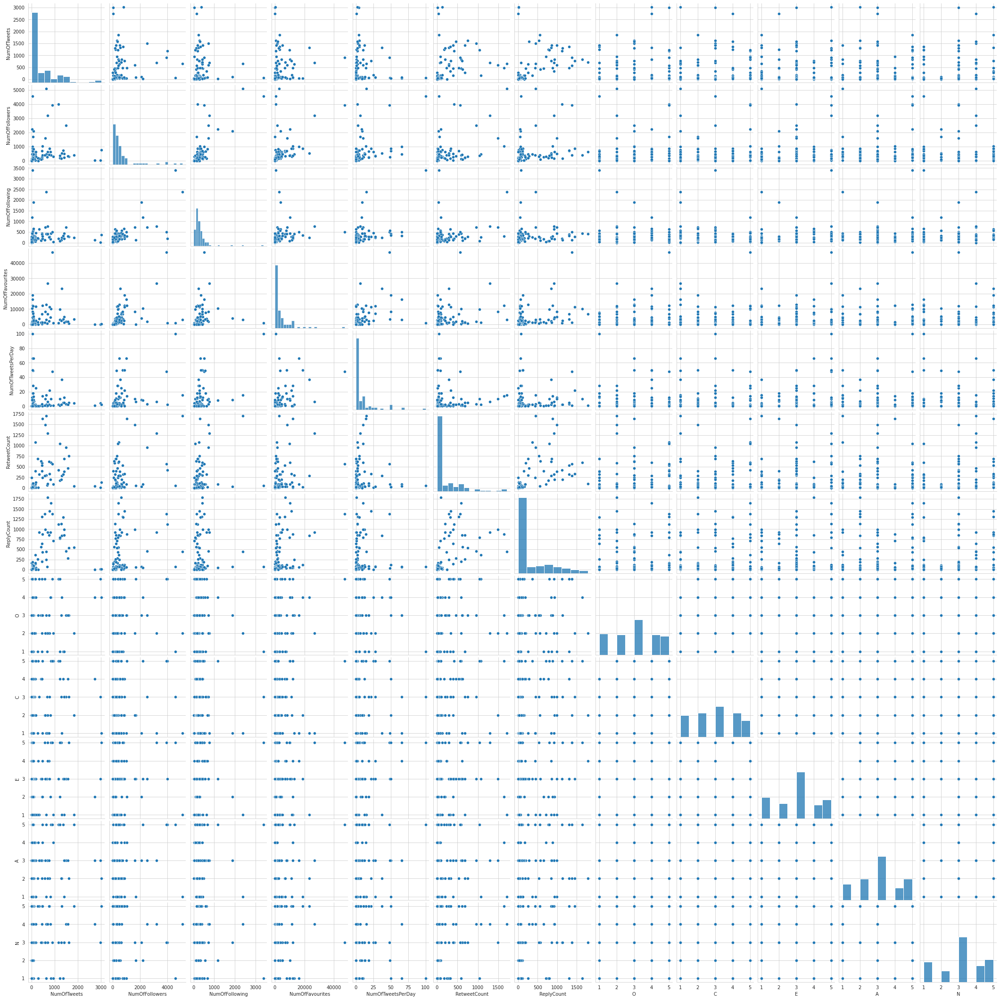

In [54]:
sb.pairplot(dfM)

In [55]:
O_p = df_multi['O_Sc']
C_p = df_multi['C_Sc']
E_p = df_multi['E_Sc']
A_p = df_multi['A_Sc']
N_p = df_multi['N_Sc']
NT_p = df_multi['NumOfTweets']
NF_p = df_multi['NumOfFollowers']
NFg_p = df_multi['NumOfFollowing']
NFv_p = df_multi['NumOfFavourites']
NTD_p = df_multi['NumOfTweetsPerDay']
NR_p = df_multi['RetweetCount']
NRp_p = df_multi['ReplyCount']

spearmanr_coef1_O, p_value = spearmanr(O_p ,NT_p)
spearmanr_coef2_O, p_value = spearmanr(O_p ,NF_p)
spearmanr_coef3_O, p_value = spearmanr(O_p ,NFg_p)
spearmanr_coef4_O, p_value = spearmanr(O_p ,NFv_p)
spearmanr_coef5_O, p_value = spearmanr(O_p ,NTD_p)
spearmanr_coef6_O, p_value = spearmanr(O_p ,NR_p)
spearmanr_coef7_O, p_value = spearmanr(O_p ,NRp_p)
print('Spearman Rank Correlation Coef %0.3f',(spearmanr_coef1_O,spearmanr_coef2_O,spearmanr_coef3_O,spearmanr_coef4_O,spearmanr_coef5_O,spearmanr_coef6_O,spearmanr_coef7_O))

Spearman Rank Correlation Coef %0.3f (0.0228630206495604, 0.11865580621104124, -0.020452689140777674, 0.0782428058526027, 0.012671535623645392, 0.010271980097974332, 0.06110281509244321)


In [56]:
spearmanr_coef1_C, p_value = spearmanr(C_p ,NT_p)
spearmanr_coef2_C, p_value = spearmanr(C_p ,NF_p)
spearmanr_coef3_C, p_value = spearmanr(C_p ,NFg_p)
spearmanr_coef4_C, p_value = spearmanr(C_p ,NFv_p)
spearmanr_coef5_C, p_value = spearmanr(C_p ,NTD_p)
spearmanr_coef6_C, p_value = spearmanr(C_p ,NR_p)
spearmanr_coef7_C, p_value = spearmanr(C_p ,NRp_p)
print('Spearman Rank Correlation Coef %0.3f',(spearmanr_coef1_C,spearmanr_coef2_C,spearmanr_coef3_C,spearmanr_coef4_C,spearmanr_coef5_C,spearmanr_coef6_C,spearmanr_coef7_C))

Spearman Rank Correlation Coef %0.3f (0.04389711420720336, -0.057745763935141574, -0.09059578345591394, -0.0692928611954654, -0.07812891532029757, 0.0188420338002324, 0.04393487842851451)


In [57]:
spearmanr_coef1_E, p_value = spearmanr(E_p ,NT_p)
spearmanr_coef2_E, p_value = spearmanr(E_p ,NF_p)
spearmanr_coef3_E, p_value = spearmanr(E_p ,NFg_p)
spearmanr_coef4_E, p_value = spearmanr(E_p ,NFv_p)
spearmanr_coef5_E, p_value = spearmanr(E_p ,NTD_p)
spearmanr_coef6_E, p_value = spearmanr(E_p ,NR_p)
spearmanr_coef7_E, p_value = spearmanr(E_p ,NRp_p)
print('Spearman Rank Correlation Coef %0.3f',(spearmanr_coef1_E,spearmanr_coef2_E,spearmanr_coef3_E,spearmanr_coef4_E,spearmanr_coef5_E,spearmanr_coef6_E,spearmanr_coef7_E))

Spearman Rank Correlation Coef %0.3f (0.03931028162660745, 0.2305926054790752, 0.11920053152385528, 0.16680245103174063, 0.35901339810173577, 0.16204800158627458, 0.19859314973042444)


In [58]:
spearmanr_coef1_A, p_value = spearmanr(A_p ,NT_p)
spearmanr_coef2_A, p_value = spearmanr(A_p ,NF_p)
spearmanr_coef3_A, p_value = spearmanr(A_p ,NFg_p)
spearmanr_coef4_A, p_value = spearmanr(A_p ,NFv_p)
spearmanr_coef5_A, p_value = spearmanr(A_p ,NTD_p)
spearmanr_coef6_A, p_value = spearmanr(A_p ,NR_p)
spearmanr_coef7_A, p_value = spearmanr(A_p ,NRp_p)
print('Spearman Rank Correlation Coef %0.3f',(spearmanr_coef1_A,spearmanr_coef2_A,spearmanr_coef3_A,spearmanr_coef4_A,spearmanr_coef5_A,spearmanr_coef6_A,spearmanr_coef7_A))

Spearman Rank Correlation Coef %0.3f (0.08404724157467422, 0.06784215251389501, 0.037749759928877254, 0.0974593316547239, 0.12974086585600966, 0.031212486390754777, 0.06954571443446096)


In [59]:
spearmanr_coef1_N, p_value = spearmanr(N_p ,NT_p)
spearmanr_coef2_N, p_value = spearmanr(N_p ,NF_p)
spearmanr_coef3_N, p_value = spearmanr(N_p ,NFg_p)
spearmanr_coef4_N, p_value = spearmanr(N_p ,NFv_p)
spearmanr_coef5_N, p_value = spearmanr(N_p ,NTD_p)
spearmanr_coef6_N, p_value = spearmanr(N_p ,NR_p)
spearmanr_coef7_N, p_value = spearmanr(N_p ,NRp_p)
print('Spearman Rank Correlation Coef' ,(spearmanr_coef1_N,spearmanr_coef2_N,spearmanr_coef3_N,spearmanr_coef4_N,spearmanr_coef5_N,spearmanr_coef6_N,spearmanr_coef7_N))

Spearman Rank Correlation Coef (0.1743737551256395, 0.04461485711570631, 0.0711655096206816, 0.08250570933868867, 0.030110844275337244, 0.2110646662690829, 0.12435859617192964)


In [60]:
table = pd.crosstab(O_p,NT_p)
# P-value gives us the probability of finding an observation under an assumption that a particular hypothesis is true.
from scipy.stats import  chi2_contingency
chi2 , p , dof, expacted = chi2_contingency(table.values)
print('chi_square value  p_value',chi2,p)
#NT_p,NF_p ,NFg_p,NFv_p,NTD_p,NR_p,NRp_p)

chi_square value  p_value 1382.3763347763347 0.04713173611776792


In [61]:
dfM.corr(method="spearman")

,NumOfTweets,NumOfFollowers,NumOfFollowing,NumOfFavourites,NumOfTweetsPerDay,RetweetCount,ReplyCount,O,C,E,A,N
NumOfTweets,1.000000,0.408510,0.206889,0.386317,0.287676,0.691173,0.671036,0.034930,0.069741,0.040552,0.058345,0.193071
NumOfFollowers,0.408510,1.000000,0.648134,0.716418,0.628599,0.492840,0.541736,0.137728,-0.042767,0.226108,0.055096,0.048170
NumOfFollowing,0.206889,0.648134,1.000000,0.504647,0.520994,0.313560,0.283837,0.010931,-0.101538,0.120141,0.043215,0.061814
NumOfFavourites,0.386317,0.716418,0.504647,1.000000,0.625492,0.529267,0.615524,0.078848,-0.030268,0.156244,0.071553,0.094544
NumOfTweetsPerDay,0.287676,0.628599,0.520994,0.625492,1.000000,0.338915,0.326145,0.050051,-0.046545,0.324599,0.105727,-0.001431
RetweetCount,0.691173,0.492840,0.313560,0.529267,0.338915,1.000000,0.781041,0.013386,0.029657,0.144314,0.014175,0.231070
ReplyCount,0.671036,0.541736,0.283837,0.615524,0.326145,0.781041,1.000000,0.043259,0.062776,0.171768,0.038970,0.158177
O,0.034930,0.137728,0.010931,0.078848,0.050051,0.013386,0.043259,1.000000,0.102696,0.123422,0.019641,-0.126226
C,0.069741,-0.042767,-0.101538,-0.030268,-0.046545,0.029657,0.062776,0.102696,1.000000,0.116112,0.278504,-0.249514
E,0.040552,0.226108,0.120141,0.156244,0.324599,0.144314,0.171768,0.123422,0.116112,1.000000,0.148930,-0.211027


In [62]:
dfB = df_binary[['NumOfTweets', 'NumOfFollowers', 'NumOfFollowing',
      'NumOfFavourites', 'NumOfTweetsPerDay', 'RetweetCount', 'ReplyCount',
       'O','C','E','A','N']].copy()

In [63]:
dfB.corr(method="spearman")

,NumOfTweets,NumOfFollowers,NumOfFollowing,NumOfFavourites,NumOfTweetsPerDay,RetweetCount,ReplyCount,O,C,E,A,N
NumOfTweets,1.000000,0.408510,0.206889,0.386317,0.287676,0.691173,0.671036,-0.015569,-0.002461,0.019722,0.075551,0.146980
NumOfFollowers,0.408510,1.000000,0.648134,0.716418,0.628599,0.492840,0.541736,0.047934,-0.082856,0.176670,0.087933,-0.018014
NumOfFollowing,0.206889,0.648134,1.000000,0.504647,0.520994,0.313560,0.283837,-0.080711,-0.060297,0.114222,0.125503,-0.009416
NumOfFavourites,0.386317,0.716418,0.504647,1.000000,0.625492,0.529267,0.615524,0.043428,-0.052093,0.181191,0.093300,0.037256
NumOfTweetsPerDay,0.287676,0.628599,0.520994,0.625492,1.000000,0.338915,0.326145,-0.043169,-0.066718,0.313132,0.074330,-0.005445
RetweetCount,0.691173,0.492840,0.313560,0.529267,0.338915,1.000000,0.781041,-0.018848,0.001231,0.125740,0.082577,0.203499
ReplyCount,0.671036,0.541736,0.283837,0.615524,0.326145,0.781041,1.000000,-0.001639,0.005334,0.180829,0.080111,0.094598
O,-0.015569,0.047934,-0.080711,0.043428,-0.043169,-0.018848,-0.001639,1.000000,0.062574,-0.003799,0.038169,-0.153300
C,-0.002461,-0.082856,-0.060297,-0.052093,-0.066718,0.001231,0.005334,0.062574,1.000000,0.016164,0.057321,-0.132165
E,0.019722,0.176670,0.114222,0.181191,0.313132,0.125740,0.180829,-0.003799,0.016164,1.000000,-0.011483,0.019929


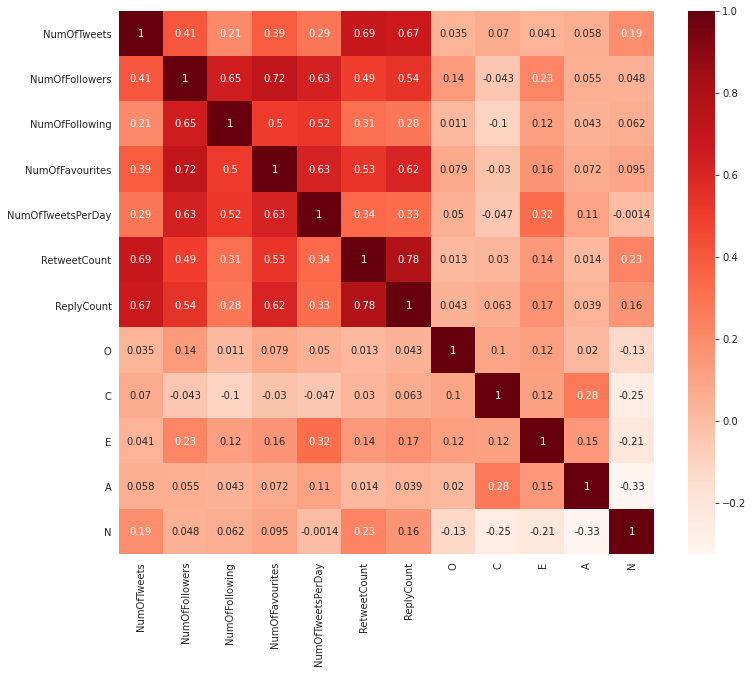

In [64]:
import seaborn as sns
plt.figure(figsize=(12,10))
corM = dfM.corr(method="spearman")
sns.heatmap(corM, annot=True, cmap=plt.cm.Reds)
plt.show()

In [65]:
#Correlation with output variable
#for multiclass 
cor_target_O = abs(corM['O'])
cor_target_C = abs(corM['C'])
cor_target_E = abs(corM['E'])
cor_target_A = abs(corM['A'])
cor_target_N = abs(corM['N'])
#Selecting highly correlated features
relevant_features_O = cor_target_O[cor_target_O>=0.05]
relevant_features_C = cor_target_C[cor_target_C>=0.05]
relevant_features_E = cor_target_E[cor_target_E>=0.05]
relevant_features_A = cor_target_A[cor_target_A>=0.05]
relevant_features_N = cor_target_N[cor_target_N>=0.05]


print("relevant features to O:\n",relevant_features_O)
print("\n relevant features to C:\n",relevant_features_C)
print("\n relevant features to E:\n",relevant_features_E)
print("\n relevant features to A:\n",relevant_features_A)
print("\n relevant features to N:\n",relevant_features_N)


relevant features to O:
 NumOfFollowers       0.137728
NumOfFavourites      0.078848
NumOfTweetsPerDay    0.050051
O                    1.000000
C                    0.102696
E                    0.123422
N                    0.126226
Name: O, dtype: float64

 relevant features to C:
 NumOfTweets       0.069741
NumOfFollowing    0.101538
ReplyCount        0.062776
O                 0.102696
C                 1.000000
E                 0.116112
A                 0.278504
N                 0.249514
Name: C, dtype: float64

 relevant features to E:
 NumOfFollowers       0.226108
NumOfFollowing       0.120141
NumOfFavourites      0.156244
NumOfTweetsPerDay    0.324599
RetweetCount         0.144314
ReplyCount           0.171768
O                    0.123422
C                    0.116112
E                    1.000000
A                    0.148930
N                    0.211027
Name: E, dtype: float64

 relevant features to A:
 NumOfTweets          0.058345
NumOfFollowers       0.055096
NumOfF

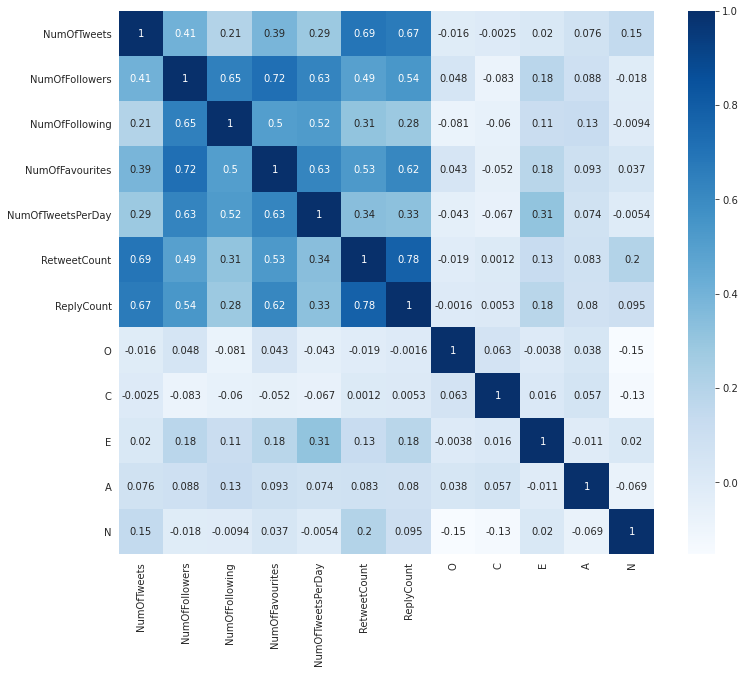

In [66]:
import seaborn as sns
plt.figure(figsize=(12,10))
corB = dfB.corr(method="spearman")
sns.heatmap(corB, annot=True, cmap=plt.cm.Blues)
plt.show()

In [67]:
#Correlation with output variable
cor_target_Ob = abs(corB['O'])
cor_target_Cb = abs(corB['C'])
cor_target_Eb = abs(corB['E'])
cor_target_Ab = abs(corB['A'])
cor_target_Nb = abs(corB['N'])
#Selecting highly correlated features
relevant_features_Ob = cor_target_Ob[cor_target_Ob>=0.05]
relevant_features_Cb = cor_target_Cb[cor_target_Cb>=0.05]
relevant_features_Eb = cor_target_Eb[cor_target_Eb>=0.05]
relevant_features_Ab = cor_target_Ab[cor_target_Ab>=0.05]
relevant_features_Nb = cor_target_Nb[cor_target_Nb>=0.05]


print("relevant features to O:\n",relevant_features_Ob)
print("\n relevant features to C:\n",relevant_features_Cb)
print("\n relevant features to E:\n",relevant_features_Eb)
print("\n relevant features to A:\n",relevant_features_Ab)
print("\n relevant features to N:\n",relevant_features_Nb)


relevant features to O:
 NumOfFollowing    0.080711
O                 1.000000
C                 0.062574
N                 0.153300
Name: O, dtype: float64

 relevant features to C:
 NumOfFollowers       0.082856
NumOfFollowing       0.060297
NumOfFavourites      0.052093
NumOfTweetsPerDay    0.066718
O                    0.062574
C                    1.000000
A                    0.057321
N                    0.132165
Name: C, dtype: float64

 relevant features to E:
 NumOfFollowers       0.176670
NumOfFollowing       0.114222
NumOfFavourites      0.181191
NumOfTweetsPerDay    0.313132
RetweetCount         0.125740
ReplyCount           0.180829
E                    1.000000
Name: E, dtype: float64

 relevant features to A:
 NumOfTweets          0.075551
NumOfFollowers       0.087933
NumOfFollowing       0.125503
NumOfFavourites      0.093300
NumOfTweetsPerDay    0.074330
RetweetCount         0.082577
ReplyCount           0.080111
C                    0.057321
A                    1.0

#Split Data Frame:
MultiClass

In [92]:
from sklearn.model_selection import train_test_split
train_M, test_M = train_test_split(df_multi, test_size=1/3)
train_B, test_B = train_test_split(df_binary, test_size=1/3)

1,2,3-grams

In [94]:
from sklearn.feature_extraction.text import CountVectorizer
#Unigrams
##multiclass
word_vectorizer = CountVectorizer(ngram_range=(1,1), analyzer='word')
sparse_matrix = word_vectorizer.fit_transform(train_M['tweets'])
frequencies = sum(sparse_matrix).data
features = (word_vectorizer.get_feature_names()) 
#pd.DataFrame(frequencies, index=word_vectorizer.get_feature_names(), columns=['frequency'])

<Figure size 720x720 with 0 Axes>

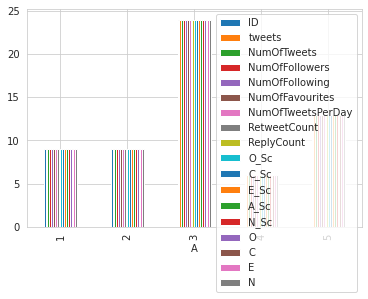

In [95]:
fig = plt.figure(figsize=(10,10))
train_M.groupby('A').count().plot.bar(ylim=0)
plt.show()

In [71]:
train_M = train_M.tweets.apply(clean_text)

انا تقريبا باعاصر سنه اسوا السنين دراسيا وربنا يكملها بالستر بجد كنت بانهار الرمد ومش عارفه الم منين منين جت الوالده بمنتهي رمد ايه وكلام فارغ ايه يللا ابداي سيف كيميا … كتر ال اللي بيكتبوها العيله جدو فبابايا كومنتاته تتراوح اللهم امين ربنا يرحمه فاحيانا بيكسل يلبس النضاره بيتوقع اصلح لي شاني كله تكلني نفسي طرفه دوار الشمس الحقيقي مقارنه فعلا بناس كتير فالواحد مشاكله اللي بتكءبه هينه واتمني افضل اتذكر دا مره احس الكون مصاب بدوار كنت لسه هاقطع شرايني ففاجءتني الكلمات المسجوعه هاتنقذني الضياع هادخل بيها الامتحان بس خلاص تحسبن العلم ينفع وحده يتوج ربه بخلاق تاني تالت انسب وصف ليا فارفق بنفسك ساعه اني اراك وهنت انا حزينه انا اقصي مراحل الزهق العالم مصاب بدوار تميم البرغوثي الاعلان دا يشتغل بابا بيقعد يبص لماما بطرف عينه بمنتهي الشزر وبيبقي مشهد ساخر الحقيقه فرح فرح باحاول ادور ذره امشي نفسي بيها الايام اللي جايه مافيش فعلا والله ليبلوني اشكر ام اكفر دوار الشمس اللي بيجيبوا درجات عاليه بيمروا بلحظات انهيار خوفا ضياع مجهود اكيد بس جيس وات اللي مابيجيبوش عالي فالعادي بيمروا بلحظات انتحار برض

In [75]:
tweets = ' '.join(list(train_M))
tweets[0:]

'انا تقريبا باعاصر سنه اسوا السنين دراسيا وربنا يكملها بالستر بجد كنت بانهار الرمد ومش عارفه الم منين منين جت الوالده بمنتهي رمد ايه وكلام فارغ ايه يللا ابداي سيف كيميا … كتر ال اللي بيكتبوها العيله جدو فبابايا كومنتاته تتراوح اللهم امين ربنا يرحمه فاحيانا بيكسل يلبس النضاره بيتوقع اصلح لي شاني كله تكلني نفسي طرفه دوار الشمس الحقيقي مقارنه فعلا بناس كتير فالواحد مشاكله اللي بتكءبه هينه واتمني افضل اتذكر دا مره احس الكون مصاب بدوار كنت لسه هاقطع شرايني ففاجءتني الكلمات المسجوعه هاتنقذني الضياع هادخل بيها الامتحان بس خلاص تحسبن العلم ينفع وحده يتوج ربه بخلاق تاني تالت انسب وصف ليا فارفق بنفسك ساعه اني اراك وهنت انا حزينه انا اقصي مراحل الزهق العالم مصاب بدوار تميم البرغوثي الاعلان دا يشتغل بابا بيقعد يبص لماما بطرف عينه بمنتهي الشزر وبيبقي مشهد ساخر الحقيقه فرح فرح باحاول ادور ذره امشي نفسي بيها الايام اللي جايه مافيش فعلا والله ليبلوني اشكر ام اكفر دوار الشمس اللي بيجيبوا درجات عاليه بيمروا بلحظات انهيار خوفا ضياع مجهود اكيد بس جيس وات اللي مابيجيبوش عالي فالعادي بيمروا بلحظات انتحار بر

In [76]:
words = tweets.split(' ')

In [77]:
unigrams_series = (pd.Series(nltk.ngrams(words, 1)).value_counts())[:10]
bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:10]
trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:10]

In [78]:
unigrams_series
bigrams_series
trigrams_series

(فرح, فرح, فرح)         2275
(صلي, الله, وسلم)       1028
(الله, صلي, الله)        520
(رسول, الله, صلي)        516
(النبي, صلي, الله)       382
(القلب, عيون, القلب)     256
(عيون, القلب, عيون)      254
(اللهم, اني, اسالك)      243
(اللهم, اني, اعوذ)       206
(اني, اعوذ, بك)          202
dtype: int64

In [87]:
unigrams_series

(فرح,)      6483
(الله,)     5584
(يا,)       2936
(مش,)       2334
(اللهم,)    2299
(انا,)      2181
(اللي,)     2175
(ده,)       1578
(ايه,)      1371
(اني,)      1339
dtype: int64

Text(0.5, 0, '# of Occurances')

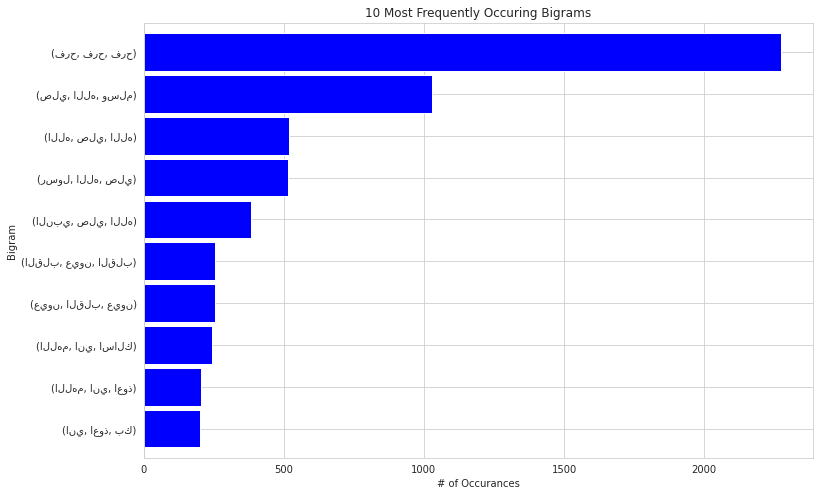

In [79]:
trigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('10 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

In [80]:
len(tweets)

1556318

In [81]:
!pip install arabic_reshaper


  Created wheel for arabic-reshaper: filename=arabic_reshaper-2.1.1-cp37-none-any.whl size=16503 sha256=28eb4595ac73217160d3a6c6fda6c6ba8dab23072bfcca70129c475698b983b1
  Stored in directory: /root/.cache/pip/wheels/62/52/d8/bd0dcbf00f9e77e3bd0184285ed77dfa9c475dac494a5353d1
Successfully built arabic-reshaper


In [82]:
!pip install python-bidi 

In [83]:
!pip install wordcloud


In [84]:
!pip install ar_wordcloud

     |████████████████████████████████| 368kB 10.9MB/s 
  Found existing installation: wordcloud 1.5.0
    Uninstalling wordcloud-1.5.0:
      Successfully uninstalled wordcloud-1.5.0


In [88]:
'''# handling arabic text
import arabic_reshaper
from bidi.algorithm import get_display
from wordcloud import WordCloud, STOPWORDS 
from ar_wordcloud import ArabicWordCloud 
from arabic_reshaper import reshape


values = ','.join([str(i) for i in words])


#data_trM = ' '.join(list([words]))
data_trM = arabic_reshaper.reshape(values)
data_trM = get_display(data_trM)


wordcloud = WordCloud(
                      background_color="white",
                      max_words=1000,
                      mode='RGBA').generate(data_trM)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


'''


import os
import codecs
from wordcloud import WordCloud
import arabic_reshaper
from bidi.algorithm import get_display

reshaped_text = arabic_reshaper.reshape(text)
artext = get_display(reshaped_text)

    
wc = WordCloud()

# Generate word cloud
wc.generate(artext)

# Show it
plt.imshow(wc)
plt.show()
plt.axis("off")

IndexError: ignored

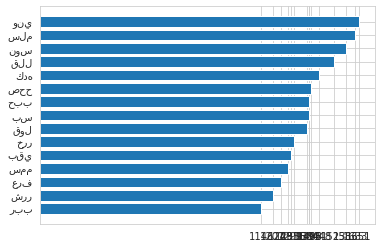

In [ ]:
from collections import Counter
from nltk.tokenize import word_tokenize

bag_words = word_tokenize(str(tweets))
cnt = Counter(bag_words)

top_15 = cnt.most_common()[10:25]

plt.barh([val[0] for val in top_15],[val[1] for val in top_15], align='center')

plt.xticks([val[1] for val in top_15])
plt.gca().invert_yaxis()
plt.show()

In [ ]:
#test_Multiclass (1,2,3-grams)
test_M = test_M.tweets.apply(clean_text)
tweets_Test = ' '.join(list(test_M))
tweets_Test[0:]

'شوف وطي حثث وزع رزز دلر هغن ويه حثث وزع رزز دلر بوك حثث وزع رزز دلر جمع عشق حوج سخخ لبب جمع مكك نقل فرح مبتذكرش ليه حظظ بنن لبب فرح فرح عوش صرر ليه فين هقبل رول نهء عمل خفش رقق صنن دنز ربب عدد فرر ركك وخد جنس شكر زوي فتح وضع يجي بنت تعرفهش زوي فتح وضع طرق رسم فتح وضع صرر بلل فيش دهه خلص ونو سوس رءل شمع لحو جمل وري صرر طءر كرر ويه صرر حتك هحل سيب لدد دهه لقق حقق كون قمه صمد عقد كثر ونك قطط تشش جفر ملل وني هخد جنس ركك فرر شوء لهه بقي ح بقي غ عزز جرح ونو كشش تيم لقم بزع بوك كلل مشش لبب حمل لعب ربع سوع خلص سوع لهه نفع جزز وجز حمد لهه عنن بشش صلو نبب ونو خلص ججو لم سمم سلسل سلسل ويه حلو صرر شرم دهب رسس روس شيط كده شكل لعب عشق كرر قدم رغث تيم حثث رزز حبب لو لو لو مون مره لو عمل رتت روح مشش لبب دهه تيم حثث رزز حبب لو وخن مشش رتت لو كسس رزز نجل لو وخن مشش رتت لو تيم شعب رزز غلب بوك يلو وخن عبب لسن دهه عشن ريح شهر ذبب صرر يلو لو بكك معع ملل علل كندر لو هم رتت بس رتت ضرش ردد يلو لو لبب معع برطر وزع ونو مشش شوف هل حوج حرس عدل لهه حسن شنن مره ركك هل كعب دور ربب رقق هل ركك هل كعب دور حلم هرم برح و

In [ ]:
words = tweets_Test.split(' ')

In [ ]:
test_unigrams_series = (pd.Series(nltk.ngrams(words, 1)).value_counts())[:10]
test_bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:10]
test_trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:10]

In [ ]:
test_unigrams_series
test_trigrams_series
test_bigrams_series


(فرح, فرح)    1837
(عون, قلب)     781
(لوج, لدد)     349
(شخص, غطي)     348
(غطي, لوج)     348
(لدد, ‍)       347
(لهه, سلم)     340
(قلب, جرح)     339
(هدد, هدد)     335
(قلب, عون)     329
dtype: int64

Text(0.5, 0, '# of Occurances')

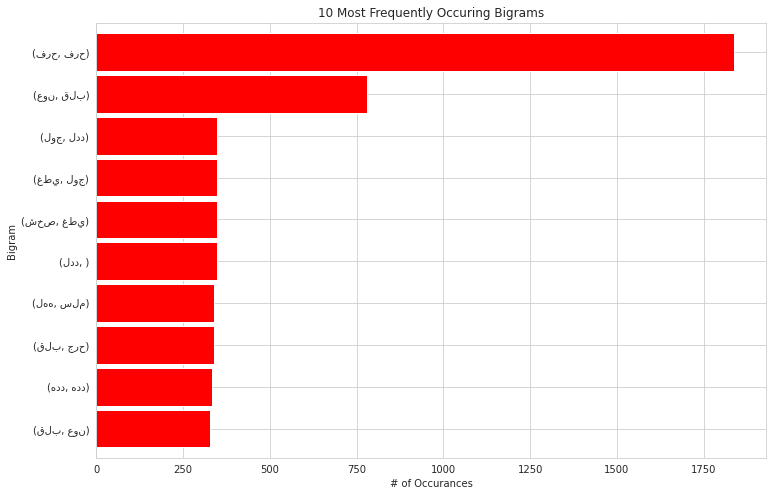

In [ ]:
test_bigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('10 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

In [ ]:
len(tweets_Test)

674632

#splitData:

In [307]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
#df_multi['tweets']=[" ".join(review) for review in df_multi['tweets'].values]


X = np.array(df_multi['tweets'])
#X = np.transpose(X)

'''
y_O = df_multi['O']
y_C = df_multi['C']
y_E = df_multi['E']
y_A = df_multi['A']
y_N = df_multi['N']
y = [y_A,y_C,y_E,y_N,y_O]'''
#X = X.reshape(-1, 1)
y = df_multi[['O', 'C', 'E', 'A', 'N']]
'''Encoder = OneHotEncoder()
#pd.get_dummies(y,drop_first = True)
y= Encoder.fit_transform(y)
X = Encoder.fit_transform(X)

pd.get_dummies'''
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size =1/3, random_state=100)
#training, test = train_test_split(features, test_size=1/3, random_state=42)

<61x92 sparse matrix of type '<class 'numpy.float64'>'
	with 61 stored elements in Compressed Sparse Row format>

In [292]:
#bag of words
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer = CountVectorizer()

# create vectors from our words
X_train_vectors = bow_vectorizer.fit_transform(X_train)
#X_countMatrix = cv.fit_transform(X['text'])
test_x_vectors = bow_vectorizer.transform(X_test)

AttributeError: ignored

In [272]:
# for evaluation save some data for later:
evaluation = []
data = len(df_multi['tweets'])
vec_name = "BoW"

In [255]:
from sklearn.feature_extraction.text import TfidfVectorizer,TfidfTransformer
#tf-idf unigrams
Tfidf_vector = TfidfVectorizer(ngram_range = (1,1))
Tfidf_vector.fit_transform(X)
X_train_Tfidf = Tfidf_vector.transform(X_train)
X_test_Tfidf = Tfidf_vector.transform(X_test)

AttributeError: ignored

In [256]:
print(X_train_Tfidf.shape)
print(X_test_Tfidf.shape)

(61, 11049)
(31, 11049)


In [257]:
#tf-idf bigrams

Tfidf_vector_bg = TfidfVectorizer(ngram_range = (2,2))
Tfidf_vector_bg.fit(df_multi['tweets'])
X_train_Tfidf_bg = Tfidf_vector_bg.transform(X_train)
X_test_Tfidf_bg = Tfidf_vector_bg.transform(X_test)

AttributeError: ignored

In [305]:
for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples, columns=['tweets', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)

  

In [306]:
one_doc_as_df

,tweets,score
0,حتي,98.005761
1,لوء,82.386393
2,نوم,73.351001
3,نهد,70.763417
4,سمع,67.826151
...,...,...
10942,سنصر,0.000000
10943,سنع,0.000000
10944,سنغل,0.000000
10945,سنك,0.000000


In [308]:
print(X_train_Tfidf_bg.shape)
print(X_test_Tfidf_bg.shape)

(61, 215528)
(31, 215528)


In [309]:
#tf-idf tri
Tfidf_vector_tri = TfidfVectorizer(ngram_range = (3,3))
Tfidf_vector_tri.fit(df_multi['tweets'])
X_train_Tfidf_tri = Tfidf_vector_tri.transform(X_train)
X_test_Tfidf_tri = Tfidf_vector_tri.transform(X_test)

In [310]:
print(X_train_Tfidf_tri.shape)
print(X_test_Tfidf_tri.shape)

(61, 332851)
(31, 332851)


In [ ]:
tf_idf_vec = TfidfVectorizer(analyzer='word', token_pattern=r'\w{1,}', max_features=20000)


In [ ]:
Encoder = LabelEncoder()
y_train = Encoder.fit_transform(y_train)
y_test = Encoder.fit_transform(y_test)

In [ ]:
X_train_Tfidf

SVM Model:

In [312]:
from sklearn.svm import SVC,LinearSVC
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import confusion_matrix,accuracy_score, classification_report
'''pipe = make_pipeline(tf_idf_vec, SVC())
param_grid = {'svc__kernel': ['rbf', 'linear', 'poly'],
             'svc__gamma': [0.1, 1, 10, 100],
             'svc__C': [0.1, 1, 10, 100]}

svc_model = GridSearchCV(pipe, param_grid, cv=5, verbose=1) 
svc_model.fit(X_train, Y_train)

prediction = svc_model.predict(X_test)
print(f"Accuracy score is {accuracy_score(Y_test, prediction):.2f}")
print(classification_report(Y_test, prediction))'''                       
vectorizer = CountVectorizer()
svm = LinearSVC()
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)
_ = svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
print(classification_report(y_test, y_pred))

'''
# Classifier - Algorithm - SVM
# fit the training dataset on the classifier
SVM = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVM.fit(X_train_Tfidf,y_train)
# predict the labels on validation dataset
predictions_SVM = SVM.predict(X_test_Tfidf)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, Test_Y)*100)'''


ValueError: ignored

In [313]:
print(confusion_matrix(y_test, y_pred))


NameError: ignored

Decesion Tree

In [ ]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

In [ ]:
tree.export_graphviz(
        dt,
        out_file="tree.dot",
        feature_names=vectorizer.get_feature_names(),
        class_names=dt.classes_,
        filled = True
)

In [ ]:
dot -Tpng tree.dot > output.png

In [ ]:
dt.fit(X_train, y_train)

In [ ]:
#Vectorize (TF-IDF, ngrams 1-4, no stop words) using sklearn -->
vectorizer = TfidfVectorizer(analyzer='word', ngram_range=(1,4),
                     min_df = 0, stop_words = 'english', sublinear_tf=True)
response = vectorizer.fit_transform(abstract_list)
classes = score_list
feature_names = vectorizer.get_feature_names()

clf = neighbors.KNeighborsRegressor(n_neighbors=1)
clf.fit(response, classes)
clf.predict(response)

KNN

In [300]:
#import the TfidfVectorizer from Scikit-Learn.
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_df=.65, min_df=1, stop_words=None, use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(df_multi['tweets'])

In [302]:
transformed_documents_as_array = transformed_documents.toarray()
# use this line of code to verify that the numpy array represents the same number of documents that we have in the file list
len(transformed_documents_as_array)

92

In [ ]:
knn = KNeighborsClassifier(n_neighbors=7)

# training our classifier ; train_data.target will be having numbers assigned for each category in train data
clf = knn.fit(X_train_tfidf, train_data.target)

# Input Data to predict their classes of the given categories
docs_new = ['I have a Harley Davidson and Yamaha.', 'I have a GTX 1050 GPU']
# building up feature vector of our input
X_new_counts = count_vect.transform(docs_new)
# We call transform instead of fit_transform because it's already been fit
X_new_tfidf = tfidf_transformer.transform(X_new_counts)

#PythonCopy
#Predict the output of our input text by using the classifier we just trained.

# predicting the category of our input text: Will give out number for category
predicted = clf.predict(X_new_tfidf)

for doc, category in zip(docs_new, predicted):
    print('%r => %s' % (doc, train_data.target_names[category]))



# We can use Pipeline to add vectorizer -> transformer -> classifier all in a one compound classifier
text_clf = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', knn),
])
# Fitting our train data to the pipeline
text_clf.fit(train_data.data, train_data.target)

# Test data 
test_data = fetch_20newsgroups(subset='test',
                               categories=categories, shuffle=True, random_state=42)
docs_test = test_data.data
# Predicting our test data
predicted = text_clf.predict(docs_test)
print('We got an accuracy of',np.mean(predicted == test_data.target)*100, '% over the test data.')